In [2]:
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms

/sw/lib/python2.7/site-packages/matplotlib/font_manager.py:278: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/sw/lib/python2.7/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")
/sw/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [3]:
os.chdir('/Users/Erin/git/moo_and_mcmc/dream/examples/ndim_gaussian/')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = np.load('ndimgauss_mtdreamzs_3chain_'+str(trace)+'1_sampled_params_chain_0.npy')
    traces[trace] = [traces[trace]]
    for chain in range(1, 3):
        traces[trace].append(np.load('ndimgauss_mtdreamzs_3chain_'+str(trace)+'1_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = np.load('ndimgauu_mtdreamzs_3chain_'+str(trace)+'1_logps_chain_0.npy')
    logps[trace] = [logps[trace]]
    for chain in range(1, 3):
        logps[trace].append(np.load('ndimgauu_mtdreamzs_3chain_'+str(trace)+'1_logps_chain_'+str(chain)+'.npy'))

In [6]:
traces['a'][0].shape

(50000, 100)

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [str(i) for i in range(100)]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(param_trace_dict_a['param_list']):
        param_trace_dict_a[param] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [str(i) for i in range(100)]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  100  of  100  parameters.
Percent of parameters with GR below 1.2:  100.0
Number of parameters with GR below 1.1:  100  of  100  parameters.
Percent of parameters with GR below 1.1:  100.0


[100, 100.0, 100, 100.0]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  100  of  100  parameters.
Percent of parameters with GR below 1.2:  100.0
Number of parameters with GR below 1.1:  100  of  100  parameters.
Percent of parameters with GR below 1.1:  100.0


[100, 100.0, 100, 100.0]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  100  of  100  parameters.
Percent of parameters with GR below 1.2:  100.0
Number of parameters with GR below 1.1:  100  of  100  parameters.
Percent of parameters with GR below 1.1:  100.0


[100, 100.0, 100, 100.0]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  100  of  100  parameters.
Percent of parameters with GR below 1.2:  100.0
Number of parameters with GR below 1.1:  100  of  100  parameters.
Percent of parameters with GR below 1.1:  100.0


[100, 100.0, 100, 100.0]

50000
3
50000


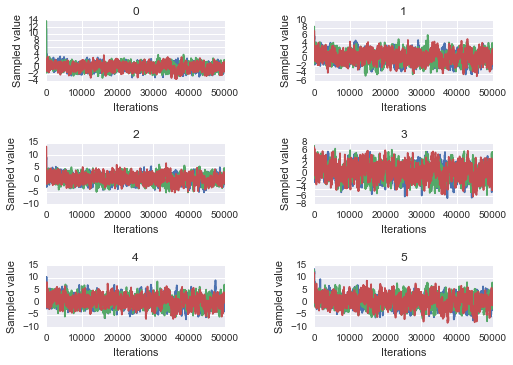

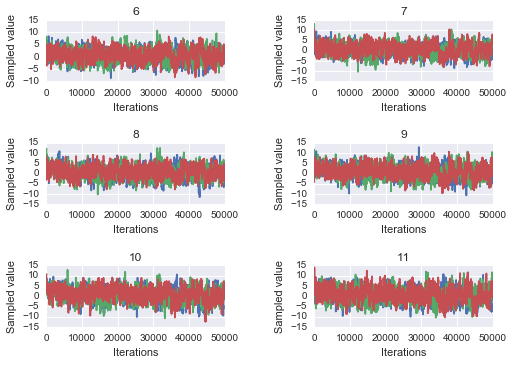

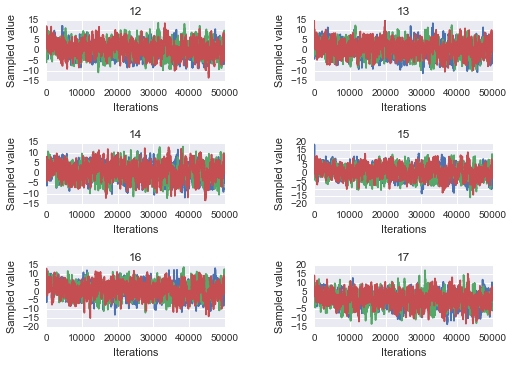

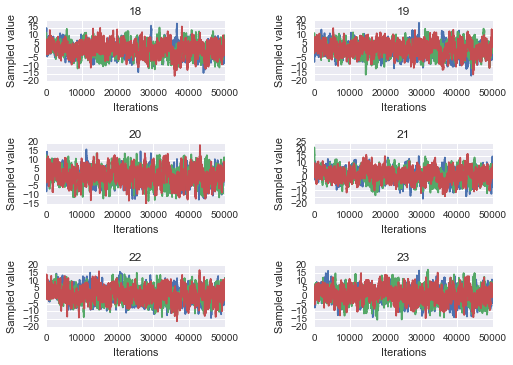

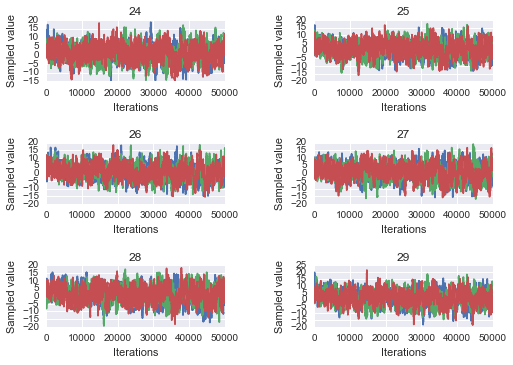

...

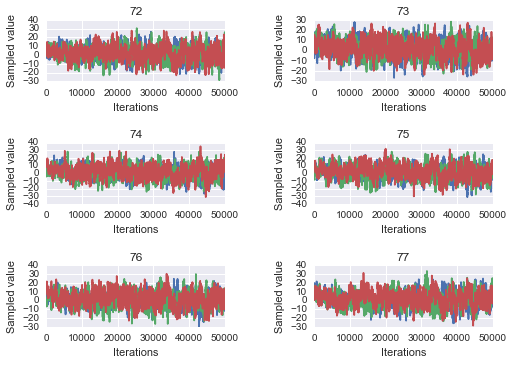

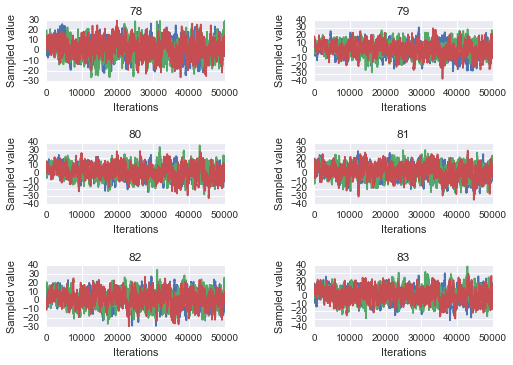

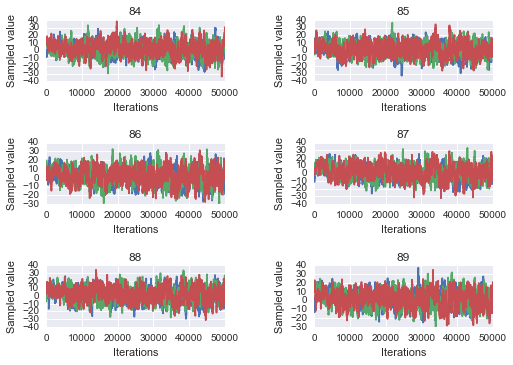

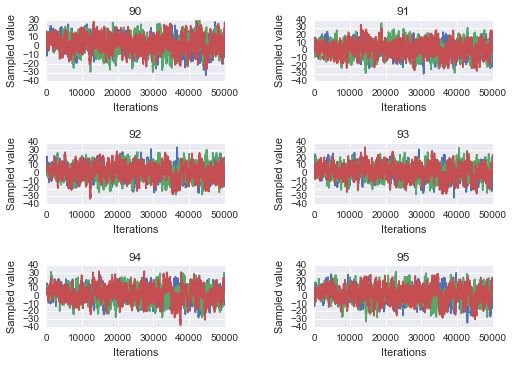

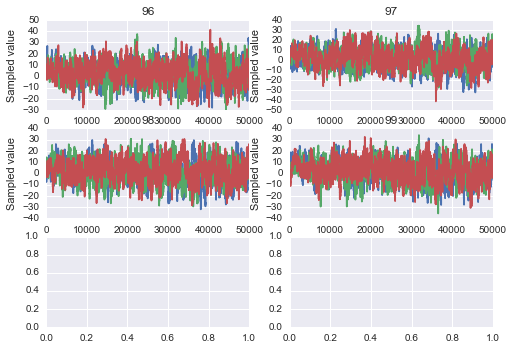

In [11]:
sample_plots(param_trace_dicts['a'])

50000
3
50000


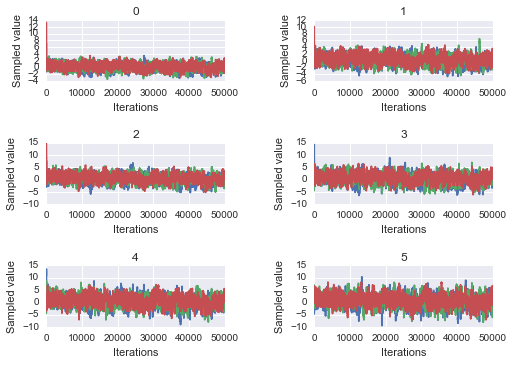

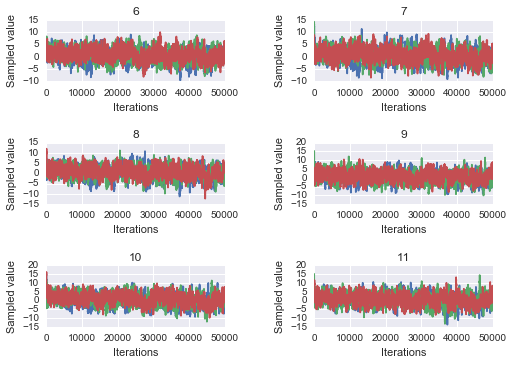

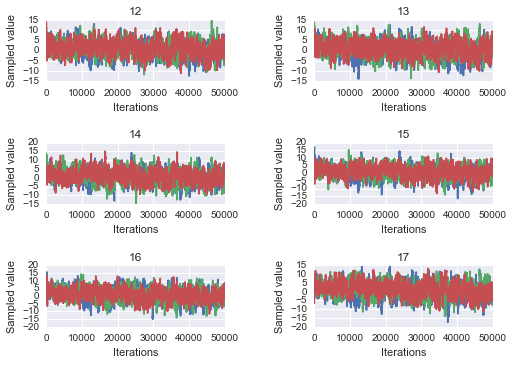

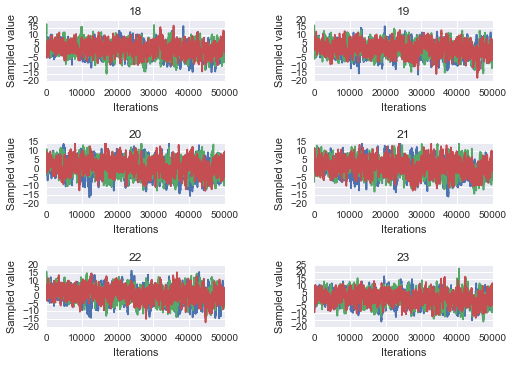

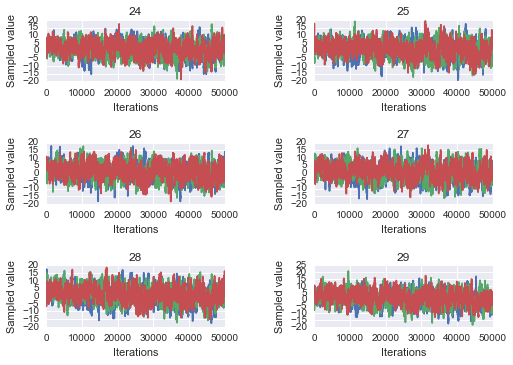

...

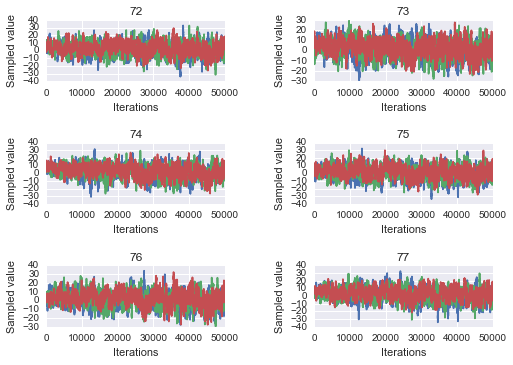

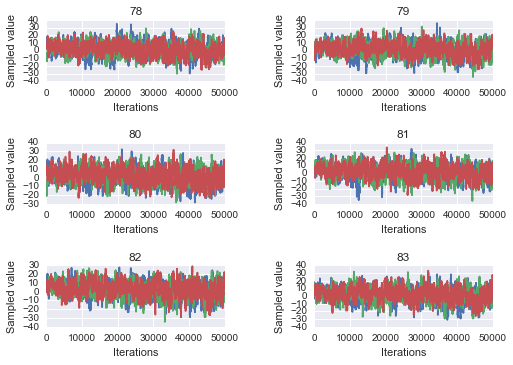

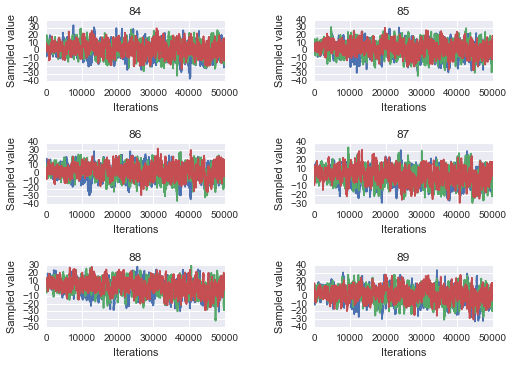

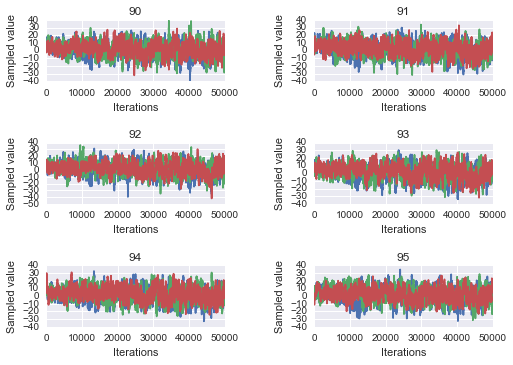

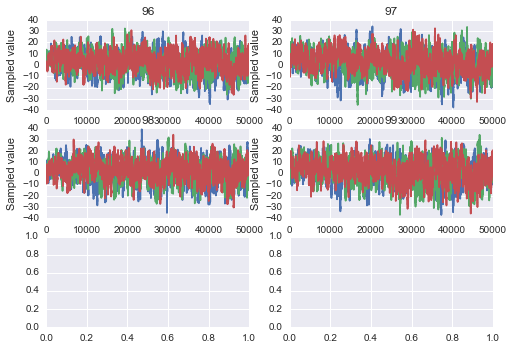

In [12]:
sample_plots(param_trace_dicts['b'])

50000
3
50000


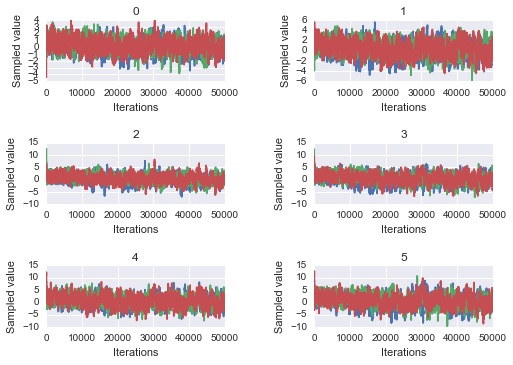

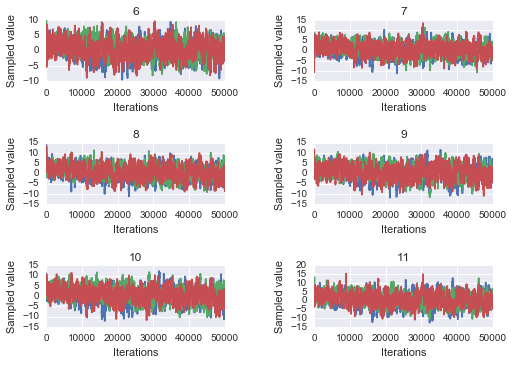

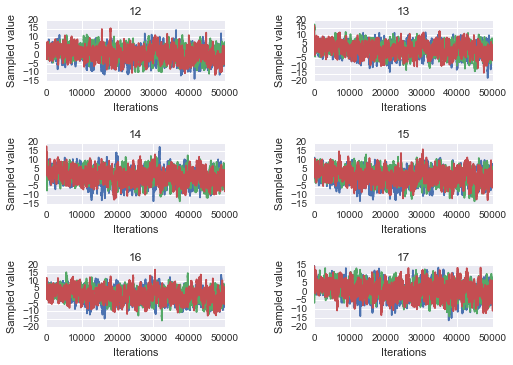

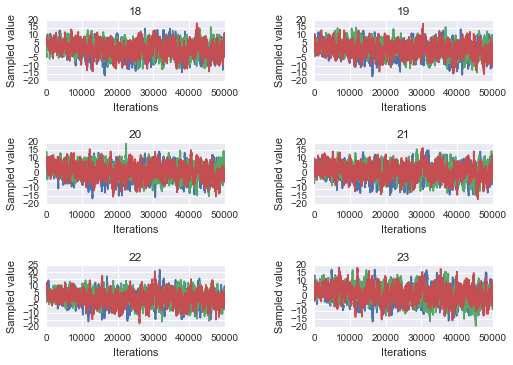

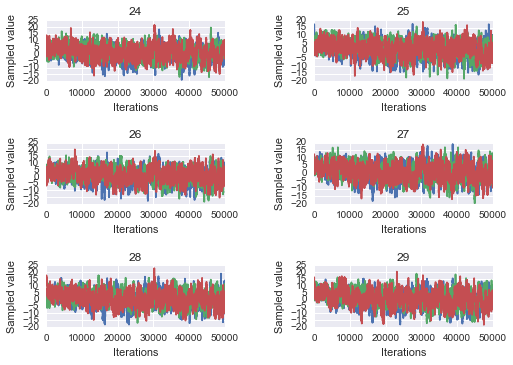

...

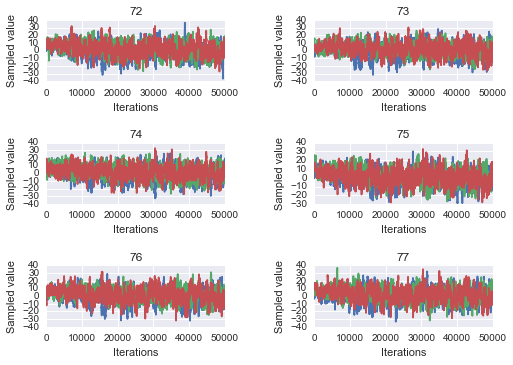

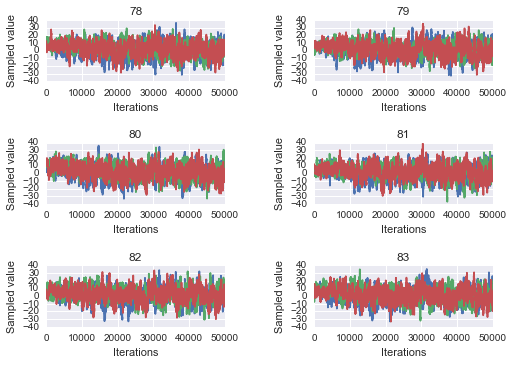

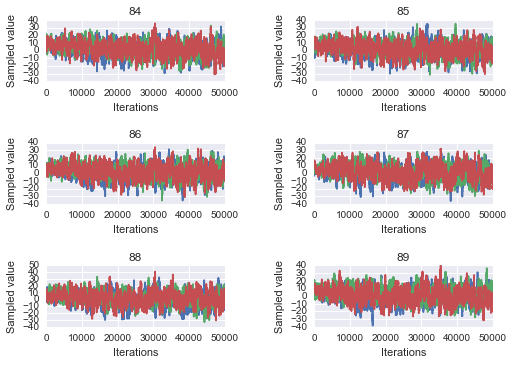

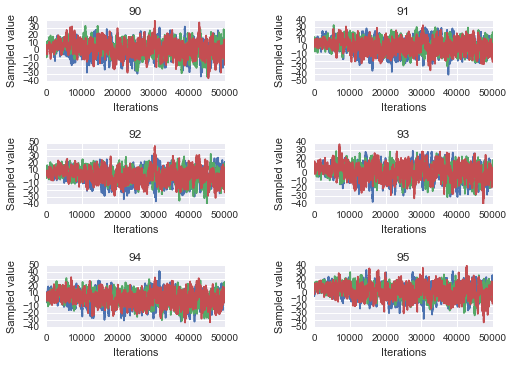

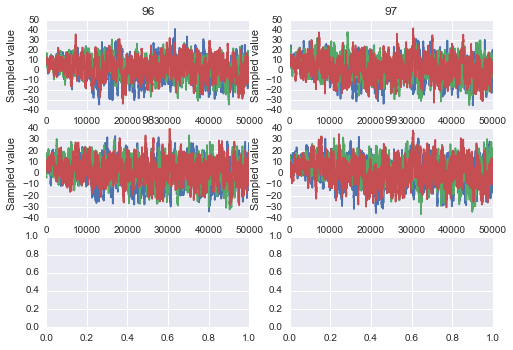

In [13]:
sample_plots(param_trace_dicts['c'])

50000
3
50000


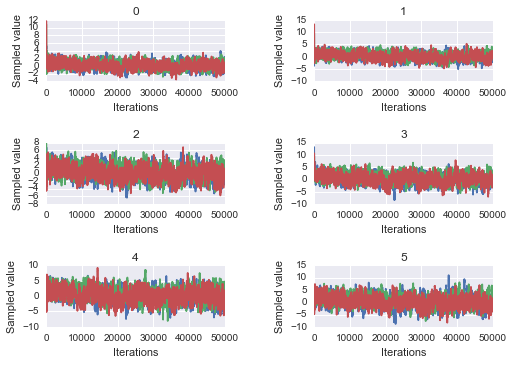

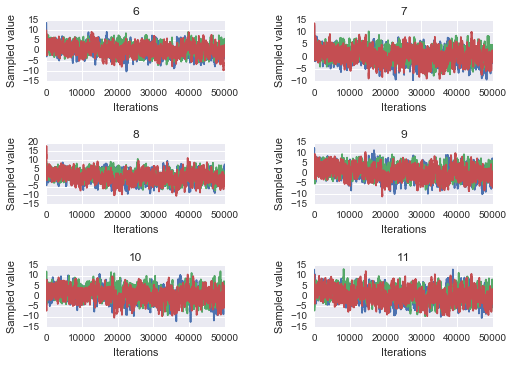

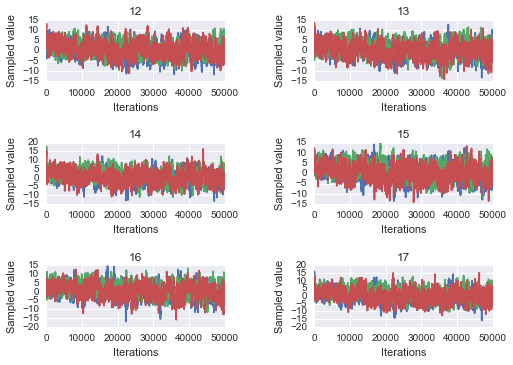

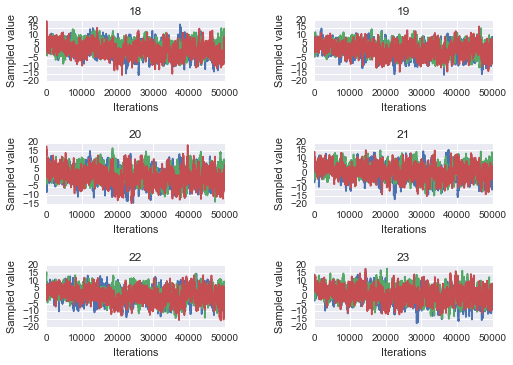

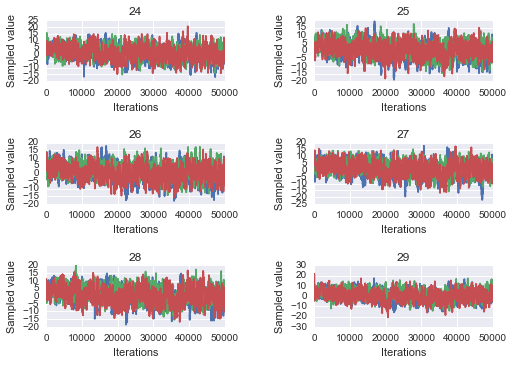

...

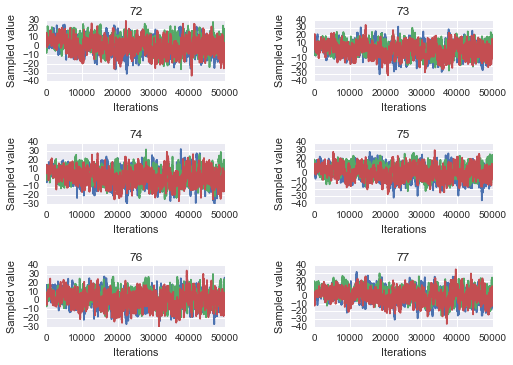

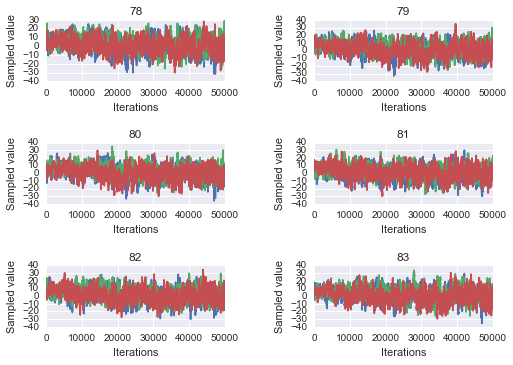

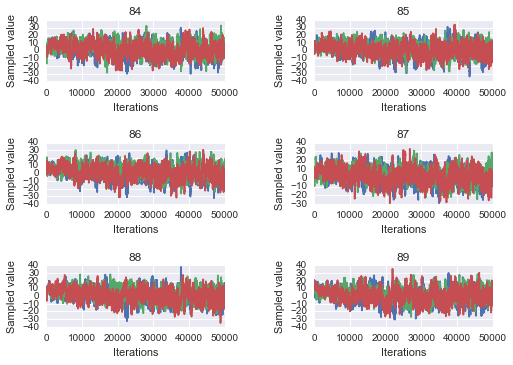

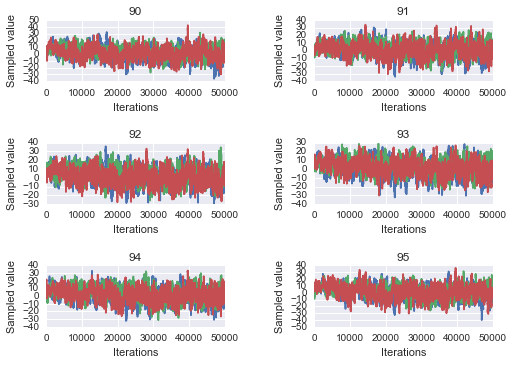

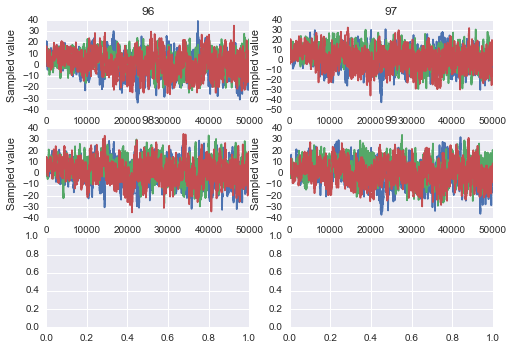

In [ ]:
sample_plots(param_trace_dicts['d'])

In [25]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=25000, thin=500)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=25000, thin=500)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=25000, thin=500)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=25000, thin=500)

In [9]:
d = 100
A = .5 * np.identity(d) + .5 * np.ones((d,d))
C = np.zeros((d,d))
for i in range(d):
    for j in range(d):
        C[i][j] = A[i][j] * np.sqrt((i+1)*(j+1))
mu = np.zeros(d)
samples = np.random.multivariate_normal(mu, C, 100000)

In [19]:
samples.shape

(100000, 100)

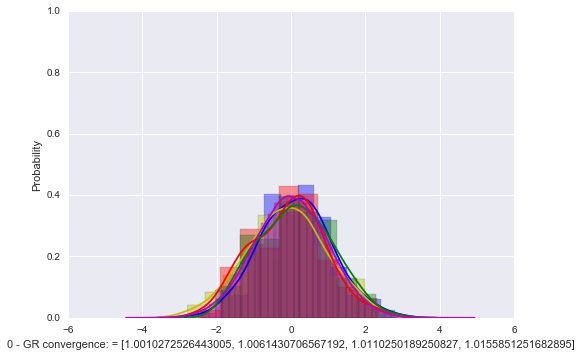

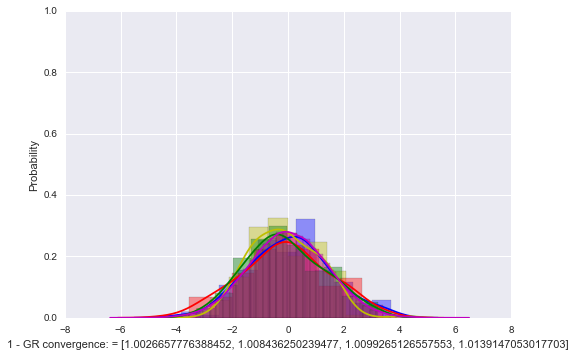

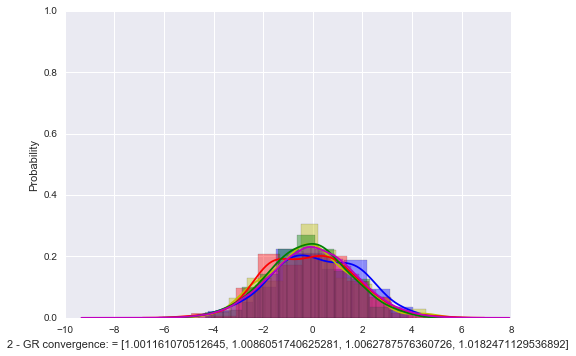

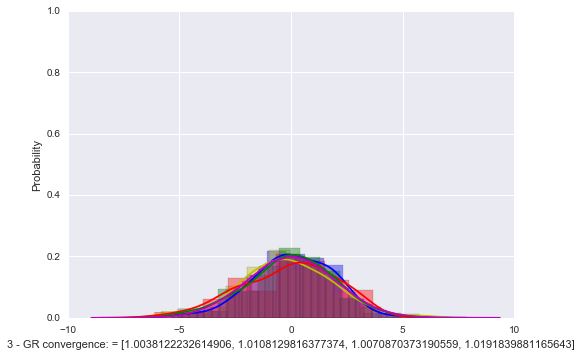

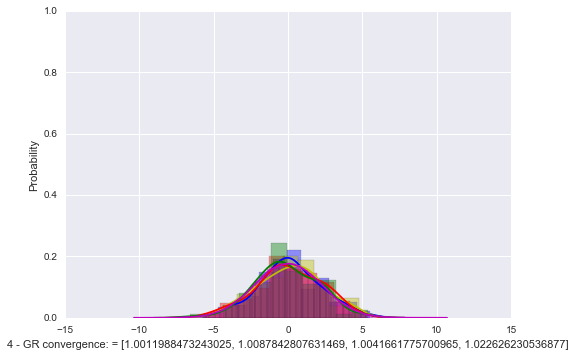

...

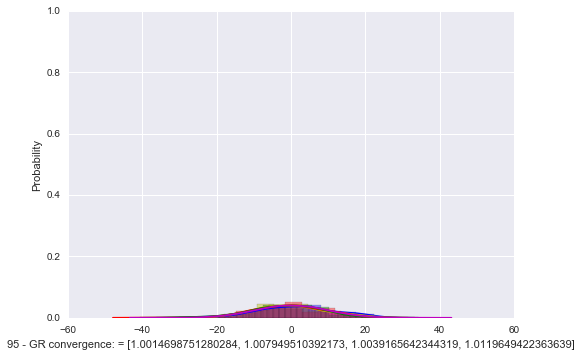

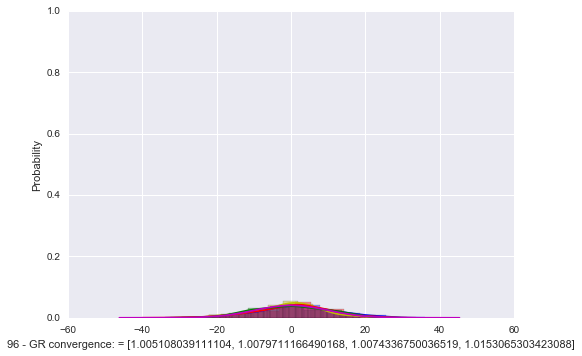

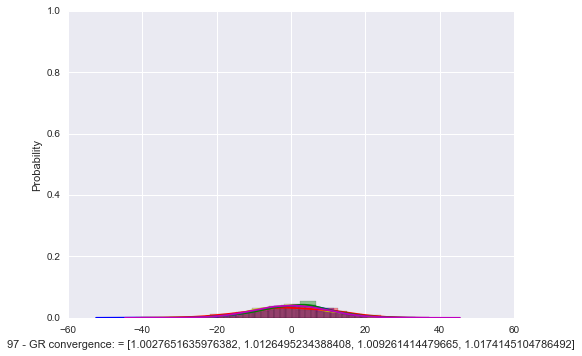

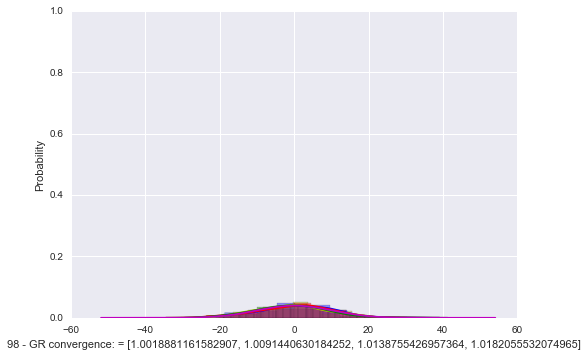

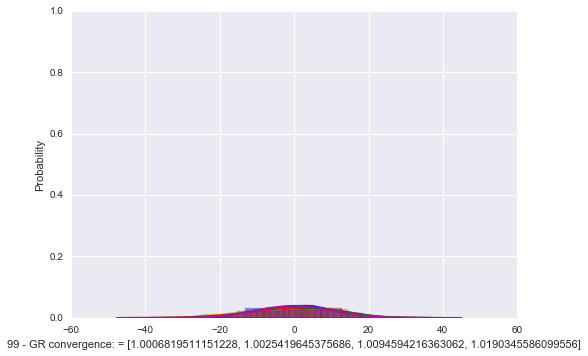

In [28]:
for dim, param_name in enumerate(param_trace_dicts['a']['param_list']):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    sns.distplot(samples[:,dim], hist=True, color='m')
    ax.set_ylim(0, 1.0)
    convg_summary = [gelman_rubin_dicts[trace][param_name] for trace in ['a', 'b', 'c', 'd']]
    sns.axlabel(param_name+' - GR convergence: = '+str(convg_summary), 'Probability')

In [11]:
from scipy.stats import ks_2samp
from scipy.misc import comb

In [12]:
kstat = np.zeros((len(trace_arr_b[0]), int(comb(4, 2))))
pval = np.zeros((len(trace_arr_b[0]), int(comb(4, 2))))

In [26]:
trace_arrs = {}
trace_arrs['a'] = trace_arr_a
trace_arrs['b'] = trace_arr_b
trace_arrs['c'] = trace_arr_c
trace_arrs['d'] = trace_arr_d
for dim in range(len(trace_arr_b[0])):
    for i, combo in enumerate([('a', 'b'), ('a', 'c'), ('a', 'd'),('b', 'c'), ('b', 'd'), ('c', 'd')]):
        kstat[dim, i], pval[dim, i] = ks_2samp(trace_arrs[combo[0]][:,dim], trace_arrs[combo[1]][:,dim])

In [27]:
pval

array([[ 0.27373254,  0.27373254,  0.98042606,  0.79999365,  0.21549619,
         0.12794808],
       [ 0.21549619,  0.51089836,  0.12794808,  0.42194315,  0.79999365,
         0.88201456],
       [ 0.12794808,  0.27373254,  0.07184758,  0.60691287,  0.99598329,
         0.51089836],
       [ 0.34255012,  0.21549619,  0.88201456,  0.51089836,  0.42194315,
         0.60691287],
       [ 0.79999365,  0.88201456,  0.51089836,  0.88201456,  0.34255012,
         0.79999365],
       [ 0.21549619,  0.79999365,  0.12794808,  0.09654411,  0.79999365,
         0.12794808],
       [ 0.05273665,  0.01920297,  0.07184758,  0.51089836,  0.88201456,
         0.34255012],
       [ 0.98042606,  0.60691287,  0.27373254,  0.70550709,  0.60691287,
         0.98042606],
       [ 0.27373254,  0.21549619,  0.05273665,  0.70550709,  0.51089836,
         0.16722328],
       [ 0.16722328,  0.42194315,  0.42194315,  0.09654411,  0.51089836,
         0.42194315],
       [ 0.34255012,  0.12794808,  0.51089836,  0.

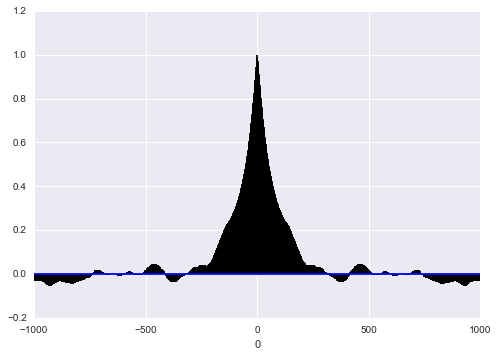

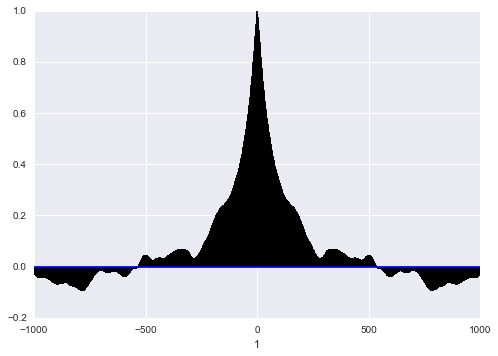

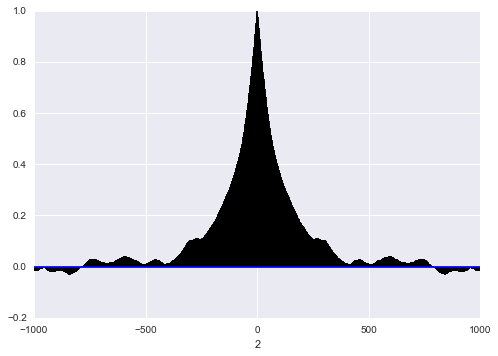

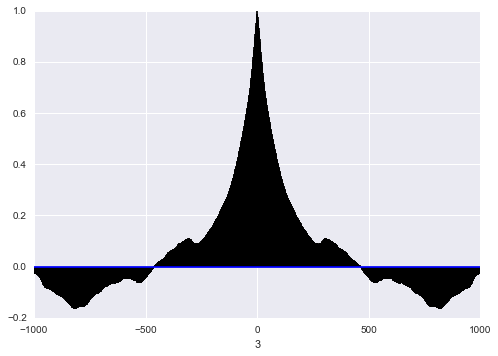

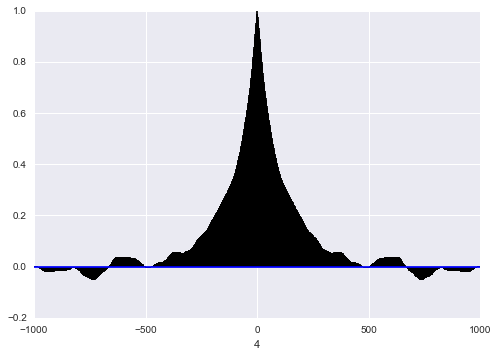

...

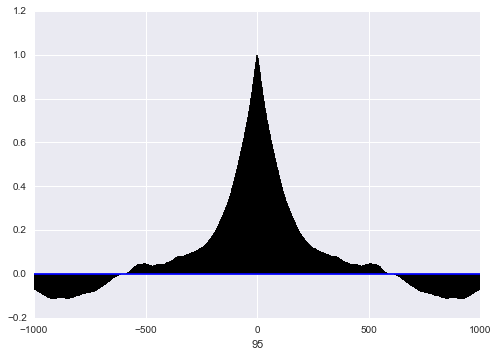

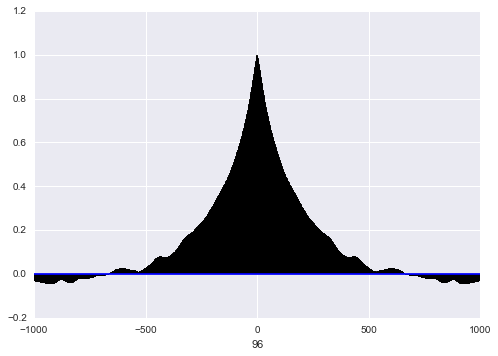

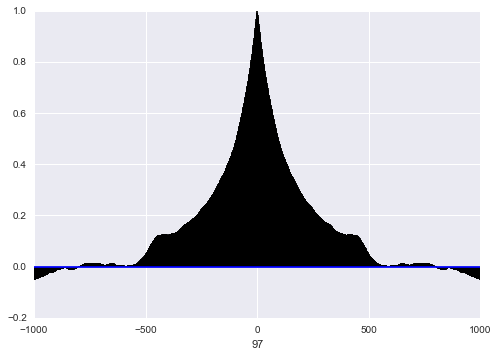

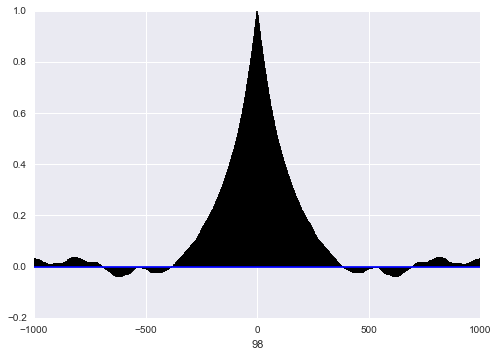

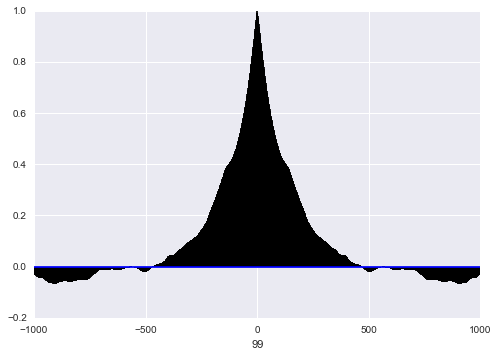

In [23]:
for dim, param_name in enumerate(param_trace_dicts['a']['param_list']):
    fig = plt.figure()
    plt.acorr(traces['c'][0][25000:,dim], maxlags=1000)
    plt.xlabel(str(param_name))

In [36]:
matlab_pars['a'][75000:].shape

(75000, 102)

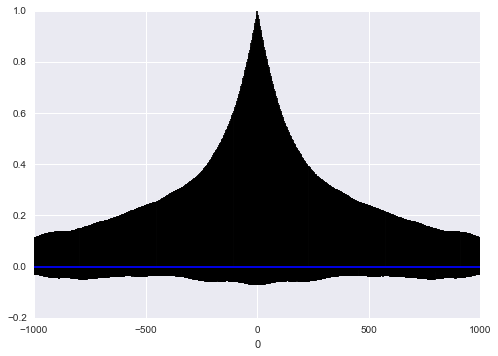

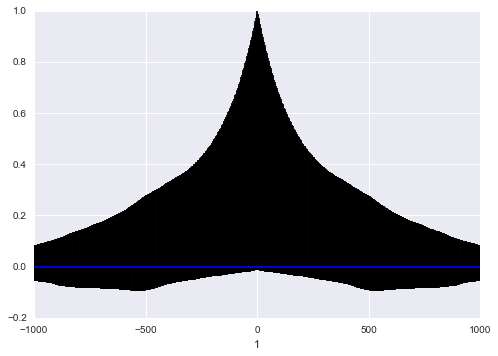

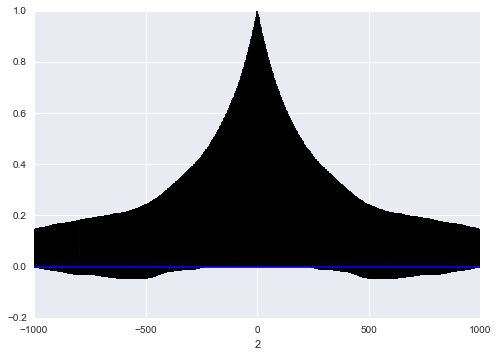

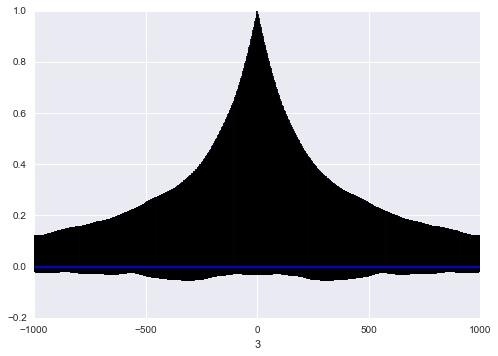

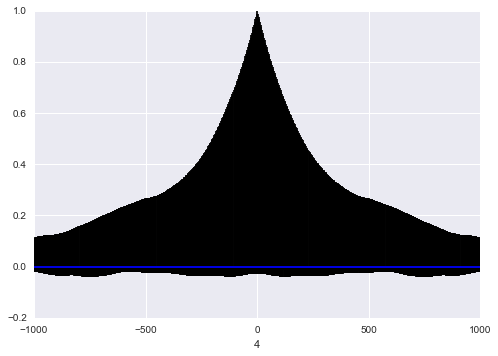

...

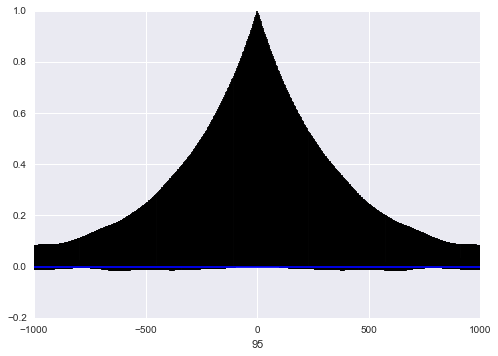

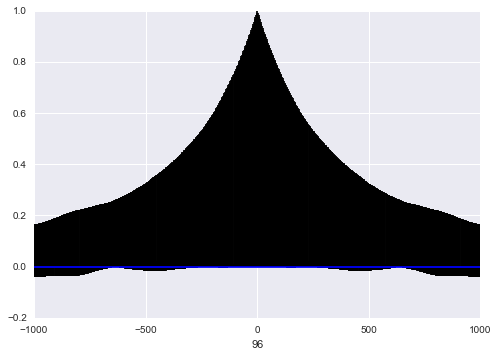

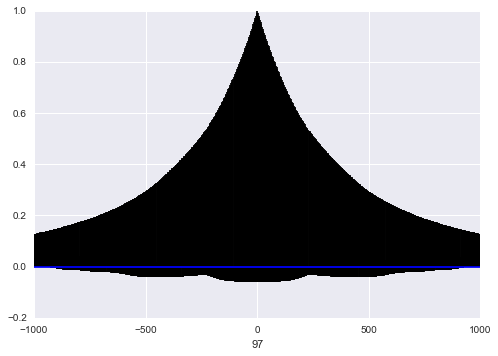

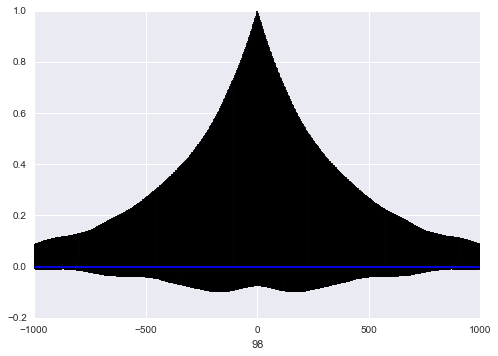

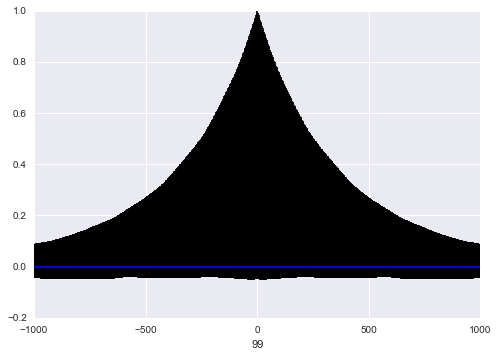

In [33]:
for dim, param_name in enumerate(param_trace_dicts['a']['param_list']):
    fig = plt.figure()
    plt.acorr(matlab_pars['a'][75000:,dim], maxlags=1000)
    plt.xlabel(str(param_name))

In [40]:
acceptance_rates = {}
vector_acceptance_rate = {}
running_acceptance_rates = {}
running_acceptance_rates_100window = {}
n_vector_acceptances = {}
n_100windowvec_acceptances = {}
running_acceptance_rates_vec = {}
running_acceptances_rates_vec_100window = {}
n_100window_acceptances = {}
n_acceptances = {}
for run in ['a', 'b', 'c', 'd']:
    acceptance_rates[run] = {}
    vector_acceptance_rate[run] = {}
    running_acceptance_rates[run] = {}
    running_acceptance_rates_100window[run] = {}
    n_vector_acceptances[run] = {}
    n_100windowvec_acceptances[run] = {}
    running_acceptance_rates_vec[run] = {}
    running_acceptances_rates_vec_100window[run] = {}
    n_100window_acceptances[run] = {}
    n_acceptances[run] = {}
    for chain in range(len(traces[run])):
        acceptance_rates[run][chain] = np.zeros((len(traces['a'][0][0],)))
        vector_acceptance_rate[run][chain] = 0
        running_acceptance_rates[run][chain] = np.zeros((len(traces['a'][0][0]), len(traces['a'][0])))
        running_acceptance_rates_100window[run][chain] = np.zeros((len(traces['a'][0][0]), 500))
        n_vector_acceptances[run][chain] = 0
        n_100windowvec_acceptances[run][chain] = 0
        running_acceptance_rates_vec[run][chain] = np.zeros((1, len(traces['a'][0])))
        running_acceptances_rates_vec_100window[run][chain] = np.zeros((1, 500))
        n_100window_acceptances[run][chain] = {}
        n_acceptances[run][chain] = {}
        for dim in range(len(traces[run][chain][0])):
            n_100window_acceptances[run][chain][dim] = 0
            n_acceptances[run][chain][dim] = 0
            for iteration in range(1, len(traces[run][chain])):
                if dim == 0:
                    comparison = traces[run][chain][iteration] == traces[run][chain][iteration-1]
                    if not np.all(comparison):
                        n_vector_acceptances[run][chain] += 1
                        n_100windowvec_acceptances[run][chain] += 1
                    running_acceptance_rates_vec[run][chain][0, iteration] = float(n_vector_acceptances[run][chain])/iteration
                    
                    if iteration % 100 == 0:
                        running_acceptances_rates_vec_100window[run][chain][0, iteration/100] = float(n_100windowvec_acceptances[run][chain])/100
                        n_100windowvec_acceptances[run][chain] = 0
                if traces[run][chain][iteration][dim] != traces[run][chain][iteration-1][dim]:
                    n_acceptances[run][chain][dim] += 1
                    n_100window_acceptances[run][chain][dim] += 1
                running_acceptance_rates[run][chain][dim, iteration] = float(n_acceptances[run][chain][dim])/iteration
        
                if iteration % 100 == 0:
                    running_acceptance_rates_100window[run][chain][dim, iteration/100] = float(n_100window_acceptances[run][chain][dim])/100
                    n_100window_acceptances[run][chain][dim] = 0
            
            acceptance_rates[run][chain][dim] = float(n_acceptances[run][chain][dim])/len(traces[run][chain])

In [44]:
running_acceptance_rates_vec['a'][0][0,10:]

array([ 0.        ,  0.        ,  0.08333333, ...,  0.3782627 ,
        0.37827513,  0.37828757])

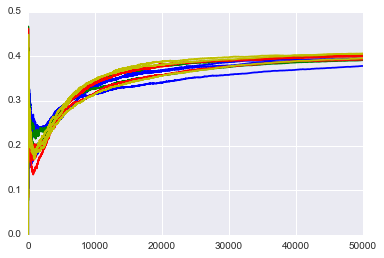

In [42]:
for run in ['a', 'b', 'c', 'd']:
        for chain in range(len(traces[run])):
            if run == 'a':
                plt.plot(range(10, 50000), running_acceptance_rates_vec[run][chain][0,10:], 'b')
            elif run == 'b':
                plt.plot(range(10, 50000), running_acceptance_rates_vec[run][chain][0,10:], 'g')
            elif run == 'c':
                plt.plot(range(10, 50000), running_acceptance_rates_vec[run][chain][0,10:], 'r')
            elif run == 'd':
                plt.plot(range(10, 50000), running_acceptance_rates_vec[run][chain][0,10:], 'y')

In [26]:
for iteration in np.arange(0, 50000, step=1000):
    ar = [[running_acceptance_rates_vec[run][chain][0,iteration] for chain in range(3)] for run in ['a', 'b', 'c', 'd']]
    mean = [np.mean(ar[i]) for i in range(len(ar))]
    print 'At iteration : ',iteration*3,' average acceptance rate: ',mean

At iteration :  0  average acceptance rate:  [0.0, 0.0, 0.0, 0.0]
At iteration :  3000  average acceptance rate:  [0.22366666666666668, 0.218, 0.17400000000000002, 0.18266666666666667]
At iteration :  6000  average acceptance rate:  [0.22683333333333333, 0.22683333333333333, 0.19499999999999998, 0.20566666666666666]
At iteration :  9000  average acceptance rate:  [0.24155555555555555, 0.23944444444444443, 0.223, 0.23088888888888889]
At iteration :  12000  average acceptance rate:  [0.26533333333333337, 0.25974999999999998, 0.25099999999999995, 0.25616666666666665]
At iteration :  15000  average acceptance rate:  [0.27773333333333333, 0.27866666666666667, 0.27099999999999996, 0.2732]
At iteration :  18000  average acceptance rate:  [0.29249999999999998, 0.29688888888888892, 0.29444444444444445, 0.2926111111111111]
At iteration :  21000  average acceptance rate:  [0.30428571428571427, 0.31047619047619052, 0.30599999999999999, 0.30819047619047618]
At iteration :  24000  average acceptance

In [30]:
import scipy.io as sio

In [31]:
matlab_ars = {}
matlab_pars = {}
for i, run in zip(range(1, 5), ['a', 'b', 'c', 'd']):
    output = sio.loadmat('output_AR_'+str(i)+'.mat')
    matlab_ars[run] = output['output']['AR']
    matlab_pars[run] = output['ParSet']

In [45]:
matlab_ars

{'a': array([[ array([[  3.00000000e+00,              nan],
        [  3.00000000e+03,   1.85333333e+01],
        [  6.00000000e+03,   2.18666667e+01],
        [  9.00000000e+03,   2.77333333e+01],
        [  1.20000000e+04,   3.15000000e+01],
        [  1.50000000e+04,   3.53666667e+01],
        [  1.80000000e+04,   3.73333333e+01],
        [  2.10000000e+04,   3.98333333e+01],
        [  2.40000000e+04,   4.08666667e+01],
        [  2.70000000e+04,   4.08000000e+01],
        [  3.00000000e+04,   4.18666667e+01],
        [  3.30000000e+04,   4.18000000e+01],
        [  3.60000000e+04,   4.04000000e+01],
        [  3.90000000e+04,   4.20000000e+01],
        [  4.20000000e+04,   4.37333333e+01],
        [  4.50000000e+04,   4.02000000e+01],
        [  4.80000000e+04,   4.23666667e+01],
        [  5.10000000e+04,   4.28333333e+01],
        [  5.40000000e+04,   4.34000000e+01],
        [  5.70000000e+04,   4.35666667e+01],
        [  6.00000000e+04,   4.27000000e+01],
        [  6.3000000

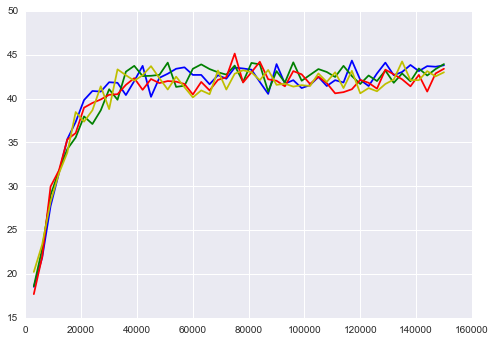

In [33]:
npoints = len(matlab_ars['a'][0][0][1:])
for run in ['a', 'b', 'c', 'd']:
    if run == 'a':
        plt.plot(matlab_ars[run][0][0][1:][:,0], matlab_ars[run][0][0][1:][:,1], 'b')
    elif run == 'b':
        plt.plot(matlab_ars[run][0][0][1:][:,0], matlab_ars[run][0][0][1:][:,1], 'g')
    elif run == 'c':
        plt.plot(matlab_ars[run][0][0][1:][:,0], matlab_ars[run][0][0][1:][:,1], 'r')
    elif run == 'd':
        plt.plot(matlab_ars[run][0][0][1:][:,0], matlab_ars[run][0][0][1:][:,1], 'y')